In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
from pymf6tools.make_model import run_simulation, get_simulation
import numpy as np 

In [5]:
from pymf6tools.plotting import show_heads, show_well_head, show_concentration, show_bcs, show_bot_elevations, show_river_stages

In [6]:
model_path = r'C:\TUBAF\MODSIMPLE2\pymf6tools\tests\models\riverbase'
model_name = "riverbase"

In [7]:
run_simulation(model_path)

In [8]:
show_bcs?

Signature:
show_bcs(
    model_path,
    name,
    title='Boundary Conditions',
    bc_names=('chd', 'wel', 'riv'),
    show_grid=True,
)
Docstring: Show location of boundary conditions.
File:      c:\tubaf\modsimple2\pymf6tools\src\pymf6tools\plotting.py
Type:      function

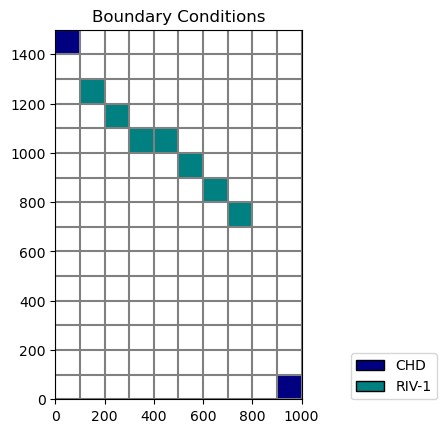

In [9]:
show_bcs(model_path, model_name, bc_names=('chd', 'riv-1'))

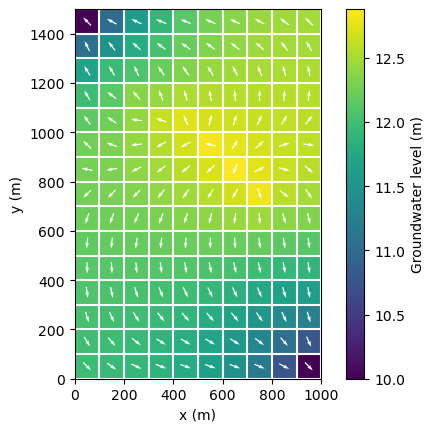

In [10]:
show_heads(model_path, model_name, show_wells=False)

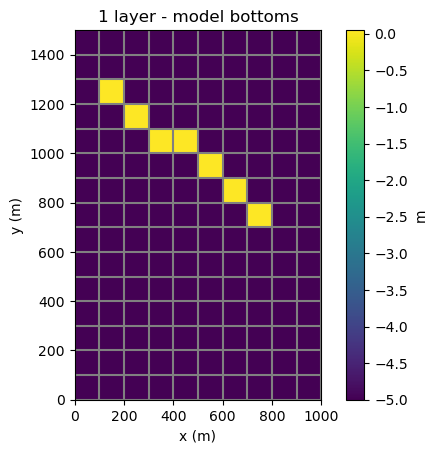

In [11]:
show_bot_elevations(model_path, model_name, max_top=15., max_botm=-15., layer=1)

In [12]:
sim = get_simulation(model_path, model_name)
ml = sim.get_model(model_name)
dis = ml.get_package('dis')
bottom_array = dis.botm

In [13]:
riv = ml.get_package('riv')

In [14]:
riv.data_list 

[,
 ,
 ,
 ,
 ,
 ,
 ,
 ,
 ,
 {internal}
 (7),
 {internal}
 (rec.array([((0, 2, 1), 13.        ,  7. , 0.05),
            ((0, 3, 2), 13.16666667,  7.5, 0.05),
            ((0, 4, 3), 13.33333333,  8. , 0.05),
            ((0, 4, 4), 13.5       ,  8.5, 0.05),
            ((0, 5, 5), 13.66666667,  9. , 0.05),
            ((0, 6, 6), 13.83333333,  9.5, 0.05),
            ((0, 7, 7), 14.        , 10. , 0.05)],
           dtype=[('cellid', 'O'), ('stage', '<f8'), ('cond', '<f8'), ('rbot', '<f8')]))]

In [15]:
dis.nlay.array

3

In [16]:
riv.stress_period_data.array[0]['cellid']

array([(0, 2, 1), (0, 3, 2), (0, 4, 3), (0, 4, 4), (0, 5, 5), (0, 6, 6),
       (0, 7, 7)], dtype=object)

In [35]:
riv1 = riv.stress_period_data.array[3]

In [38]:
riv2 = riv.stress_period_data.array[1]

In [36]:
riv1

rec.array([((0, 2, 1), 13.        ,  7. , 0.05),
           ((0, 3, 2), 13.16666667,  7.5, 0.05),
           ((0, 4, 3), 13.33333333,  8. , 0.05),
           ((0, 4, 4), 13.5       ,  8.5, 0.05),
           ((0, 5, 5), 13.66666667,  9. , 0.05),
           ((0, 6, 6), 13.83333333,  9.5, 0.05),
           ((0, 7, 7), 14.        , 10. , 0.05)],
          dtype=[('cellid', 'O'), ('stage', '<f8'), ('cond', '<f8'), ('rbot', '<f8')])

In [39]:
riv2

rec.array([((0, 2, 1), 13.        ,  7. , 0.05),
           ((0, 3, 2), 13.16666667,  7.5, 0.05),
           ((0, 4, 3), 13.33333333,  8. , 0.05),
           ((0, 4, 4), 13.5       ,  8.5, 0.05),
           ((0, 5, 5), 13.66666667,  9. , 0.05),
           ((0, 6, 6), 13.83333333,  9.5, 0.05),
           ((0, 7, 7), 14.        , 10. , 0.05)],
          dtype=[('cellid', 'O'), ('stage', '<f8'), ('cond', '<f8'), ('rbot', '<f8')])

In [18]:
dis.nrow.array 

15

In [19]:
array = np.full((dis.nrow.array, dis.ncol.array), -5, dtype=float)

In [20]:
for entry in riv1:
    coordinate = entry['cellid'][1:]
    array[coordinate] = entry['rbot'] 

In [21]:
coordinate

(7, 7)

In [22]:
array

array([[-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  ,  0.05, -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  ,  0.05, -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  ,  0.05,  0.05, -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  ,  0.05, -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,  0.05, -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,  0.05, -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  , -5.  ,
        -5.  ],
       [-5.  , -5.  , -5.  , -5.  , -5.  , 

In [23]:
dis.data_list

[{internal}
 ('meters'),
 ,
 ,
 ,
 ,
 {internal}
 (3),
 {internal}
 (15),
 {internal}
 (10),
 {constant 100.0},
 {constant 100.0},
 {constant 15.0},
 Layer_1{constant -5.0}
 Layer_2{constant -10.0}
 Layer_3{constant -15.0},
 ]

In [24]:
dis.blocks

{'options': length_units
 {internal}
 ('meters')
 ,
 'dimensions': nlay
 {internal}
 (3)
 
 nrow
 {internal}
 (15)
 
 ncol
 {internal}
 (10)
 ,
 'griddata': delr
 {constant 100.0}
 
 delc
 {constant 100.0}
 
 top
 {constant 15.0}
 
 botm
 Layer_1{constant -5.0}
 Layer_2{constant -10.0}
 Layer_3{constant -15.0}
 }

In [25]:
dis.botm.array[0]

array([[-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.],
       [-5., -5., -5., -5., -5., -5., -5., -5., -5., -5.]])

In [26]:
dis.top.array[0]

array([15., 15., 15., 15., 15., 15., 15., 15., 15., 15.])

In [27]:
riv.data_list

[,
 ,
 ,
 ,
 ,
 ,
 ,
 ,
 ,
 {internal}
 (7),
 {internal}
 (rec.array([((0, 2, 1), 13.        ,  7. , 0.05),
            ((0, 3, 2), 13.16666667,  7.5, 0.05),
            ((0, 4, 3), 13.33333333,  8. , 0.05),
            ((0, 4, 4), 13.5       ,  8.5, 0.05),
            ((0, 5, 5), 13.66666667,  9. , 0.05),
            ((0, 6, 6), 13.83333333,  9.5, 0.05),
            ((0, 7, 7), 14.        , 10. , 0.05)],
           dtype=[('cellid', 'O'), ('stage', '<f8'), ('cond', '<f8'), ('rbot', '<f8')]))]

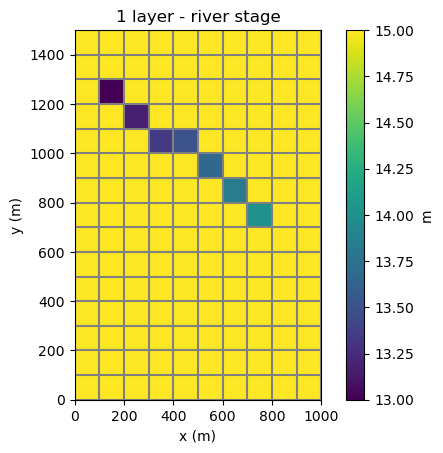

In [41]:
show_river_stages(model_path, model_name, layer=1, time_period=3)

In [49]:
riv.obs

In [54]:
ml.output.budget().get_data(text="SPDIS")

[rec.array([(  1,   1, 0., -1.94246757e-04,  2.14523375e-04,  3.97716509e-05),
            (  2,   2, 0., -1.49439340e-04,  8.21755907e-05,  1.48784868e-06),
            (  3,   3, 0., -8.08650277e-05,  4.75963998e-05, -9.13933186e-08),
            (  4,   4, 0., -4.61152117e-05,  2.11233414e-05,  1.62065767e-07),
            (  5,   5, 0., -2.90893503e-05,  1.20378092e-05,  1.08513151e-07),
            (  6,   6, 0., -1.91081404e-05,  7.77827339e-06, -7.16161453e-09),
            (  7,   7, 0., -1.24850165e-05,  5.10286925e-06,  8.59675851e-09),
            (  8,   8, 0., -7.38136729e-06,  3.20765643e-06,  2.21503796e-07),
            (  9,   9, 0., -3.99082456e-06,  3.28281251e-06, -2.00415109e-07),
            ( 10,  10, 0., -3.01907685e-06,  1.65956661e-06,  1.19732212e-07),
            ( 11,  11, 0., -6.18989721e-05,  1.54432747e-04, -3.38443208e-06),
            ( 12,  12, 0., -6.59758520e-05,  7.85255379e-05, -3.06864969e-07),
            ( 13,  13, 0., -5.03389031e-05,  4.07438